# Airplane Bird Strikes - Data Science Challenge
## Task based on a hypothetical scenario: Analysis of Airline incidents caused by birds 
As a Data Science consultant working for "Network Airlines", you have been asked to help the team with the analysis of the incident data. The dataset contains records of aircraft incidents caused by wild birds. 

Your task is to explain the data selection and analysis approach you have taken in the process of developing a machine learning model to predict a collision ("INDICATED_DAMAGE" column) using either logistic or linear regression. The selection of the regression and attributes is yours.

We would like to know the accuracy results of your model, preferably through a confusion matrix you have generated from your model, and how it can be used to avoid future incidents for the airline.

The best way to report your results is by a short presentation of 2-3 slides including key graphs and recommendations. 

You will then present your findings to the Safety Committee of the Airline and the technical team who will be ALSO assessing your notebook. 

You have 3 days to complete the task.

## Tips for you 
- No deep learning is required for the completion of this task.
- You can use any python libraries you like.
- There is no single correct solution.
- Hopefully it shouldn't take too long to complete the task but if it becomes an issue, please let us know. 

## Submission Instructions 
- Please submit your notebook and any other files you have created as part of your analysis.
1. Python Notebook file (`*.ipynb`) with the code used to develop the model and the analysis task.
2. Python (>=3.6) Requirements file (`requirements.txt`) so that we can replicate your notebook runs. (you can use `pip freeze > requirements.txt` to generate this file) 
3. PowerPoint/other presentation (`*.pdf`). 

## Data 
You will only work with a single CSV file (`strike_reports.csv`) and the accompanying metadata description (`column_description.csv`).

## Questions?

Please let us know if you need any further clarification.

## TODO
Feel free to install any libraries you need, add more cells to the notebook, etc.

# Developing a machine learning model to predict a collision   
Anthony Wynne 15/01/2022  

The approach I have taken here is to record my thoughts and construction of the model in the same way that experiments would be recorded in a laboratory notebook. Rather than trying to write a business report. Hopefully this will be useful to see how I approached the problem.  Having interviewed data scientists myself, many of them just present the finished model (often copied off the web) and then struggle to explain how they got there. So, my 'workings out' are here.   

## Running this notebook  
1. Place the notebook into its own directory along with `strike_reports.csv`, `requirements.txt`,  `column_description.csv` and `column_description_with_comments.csv`  
2. The notebook was built using Python 3.7.4 and should work with any version after that  
3. Open a terminal and navigate to the directory containing the notebook  
4. Create a new virtual environment and install all the required libraries  
`python3 -m venv venv` on windows leave the `3` out    
4. Activate the virtual environment  `source venv/bin/activate` on windows swap `bin/` for `Scripts/`   
5. Install the required libraries using `pip install -r requirements.txt`  


In [1]:
# YOUR CODE
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# still required on some systems
%matplotlib inline

## Load an explore the data  
From the `column_description.csv` file I can see that the data has been collected after the aircraft has landed at its destination airport. As such, much of the data is post incident and could not be used to predict the incident. However, this post incident data is useful for determining the severity of an incident, for particular aircraft types. There seems to be a different number of columns in the column_description file, so I will check that as well.

In [2]:
# Load the column description file
col_desc = pd.read_csv('column_description.csv')
# get the column names in the description file
col_desc_names = set(col_desc['Column Name'].to_list())

In [3]:
# Load the data file
df = pd.read_csv('strike_reports.csv')
# what have we got?
df.info(show_counts=True, max_cols=101, verbose=True)

g:\My Drive\Python\job applications\Network Rail\nr_venv\lib\site-packages\IPython\core\interactiveshell.py:3457: DtypeWarning: Columns (17,20,22) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255929 entries, 0 to 255928
Data columns (total 100 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   INDEX_NR               255929 non-null  int64  
 1   INCIDENT_DATE          255929 non-null  object 
 2   INCIDENT_MONTH         255929 non-null  int64  
 3   INCIDENT_YEAR          255929 non-null  int64  
 4   TIME                   134887 non-null  object 
 5   TIME_OF_DAY            149502 non-null  object 
 6   AIRPORT_ID             255929 non-null  object 
 7   AIRPORT                255929 non-null  object 
 8   LATITUDE               224685 non-null  float64
 9   LONGITUDE              224685 non-null  float64
 10  RUNWAY                 193572 non-null  object 
 11  STATE                  224685 non-null  object 
 12  FAAREGION              224685 non-null  object 
 13  LOCATION               29779 non-null   object 
 14  OPID                   255920 non-n

### Examine the target label

In [4]:
df['INDICATED_DAMAGE'].value_counts(dropna=False, normalize=True)

False    0.927992
True     0.072008
Name: INDICATED_DAMAGE, dtype: float64

* The target label is boolean   
* The target label True condition is only 7% of the data  
* It is an unbalanced dataset problem   
* Of the two models in scope (Logistic regression or Linear regression) the Logistic regression model is best suited for this classification problem    

### Split out a validation data set  
Before I do anything to the data I will remove a portion, that will remain untouched until the end. This will be the final test of the developed model, on data that it has not seen before. The data has a some time series structure (with reports over time) and some potential seasonality. Therefore I'm considering not using the standard train test split and shuffle of the data. Instead I will use a time window of the data to create a the validation set. I think this will reflect the way the model would be used in practice, with previous years being used to predict the current year.

In [5]:
split_year = 2021
print(len(df[df['INCIDENT_YEAR'] < split_year]))
print(len(df[df['INCIDENT_YEAR'] >= split_year]))

243139
12790


12790 values is only about 5% of the data, but it is potentially good sample size for the final test. If the damage proportion remains the same there should be approximately 900 records with damage in this data set.

In [6]:
# cut out and save the validation data
val_df = df[df['INCIDENT_YEAR'] >= split_year].copy()
df = df[df['INCIDENT_YEAR'] < split_year].copy()
val_df.to_csv('validation_data.csv', index=False)
print(len(df))

243139


### Column description file

In [7]:
# check the column names against the column description file 
# which columns are in the data but not in the description file
set(df.columns) - col_desc_names

{'AIRCRAFT',
 'DAMAGE_LEVEL',
 'ENROUTE_STATE',
 'INDEX_NR',
 'LATITUDE',
 'LONGITUDE',
 'NUM_SEEN',
 'NUM_STRUCK',
 'PHASE_OF_FLIGHT',
 'PRECIPITATION'}

In [8]:
# columns in the description file but not in the data
col_desc_names - set(df.columns)

{'ATYPE',
 'BIRDS_SEEN',
 'BIRDS_STRUCK',
 'Blank',
 'Class A',
 'Class B',
 'Class C',
 'Class D',
 'Class E',
 'D = Destroyed',
 'DAMAGE',
 'ENROUTE',
 'INDEX NR',
 'M = minor',
 'M? = uncertain level',
 'N = none',
 'PHASE_OF_FLT',
 'PRECIP',
 'REPORTED_DATE',
 'S = substantial',
 nan}

In [9]:
# Is DAMAGE_LEVEL = DAMAGE and lots of the missing columns are the values?
df['DAMAGE_LEVEL'].value_counts(dropna=False)

N      144120
NaN     81111
M        8348
M?       5382
S        4102
D          76
Name: DAMAGE_LEVEL, dtype: int64

These seem to be spelling mistakes and values from some of the columns. A new file `column_description_with_comments.csv` was created to reflect the actual columns.

### Bird Strike locations  
Latitude and longitude stand out in the list as two features that will provide some context on the data. df info above shows that they contain some missing values. I assume that these are strikes that were not noticed at the time they occurred. What regions of the world does the data cover? 

In [10]:
import plotly.express as px

fig = px.scatter_mapbox(df,
                        lat="LATITUDE",
                        lon="LONGITUDE",
                        color="INDICATED_DAMAGE",
                        title="Location of the Aircraft Bird Strikes",
                        size_max=50,
                        zoom=0.5,
                        height=600,
                        width=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 10, "t": 30, "l": 10, "b": 10})
fig.show()

The data set has a global record of bird strikes, but a much higher density in the US. The high proportion of red (True) labels coming from only 7% of the data suggests many of the lat and long coordinated are duplicated (Airports?). As birds are fairly evenly distributed across the planet, I guess this data may be for aircraft inbound to the US. Is there anything to confirm this assumption?

In [11]:
df['AIRPORT'].value_counts(dropna=False)

UNKNOWN                          29287
DENVER INTL AIRPORT               7786
DALLAS/FORT WORTH INTL ARPT       6752
CHICAGO O'HARE INTL ARPT          5371
JOHN F KENNEDY INTL               4418
                                 ...  
KENTMORR AIRPARK                     1
MALAGA ARPT                          1
TORONTO/BUTTONVILLE MUNICIPAL        1
SEMINOLE MUNICIPAL ARPT              1
IRON COUNTY AIRPORT                  1
Name: AIRPORT, Length: 2469, dtype: int64

So many unknowns! will need to investigate the low counts further and maybe add them to the unknowns.

In [12]:
# There were bird strikes in the UK is our busiest airport that fly's to the US in the list?
'LONDON HEATHROW' in df['AIRPORT'].to_list()

False

In [13]:
df['AIRPORT_ID'].value_counts(dropna=False)

ZZZZ    29287
KDEN     7786
KDFW     6752
KORD     5371
KJFK     4418
        ...  
3W3         1
LEMG        1
CYKZ        1
KSRE        1
50D         1
Name: AIRPORT_ID, Length: 2469, dtype: int64

okay, so ZZZZ is equal to unknown. And these are ICAO codes. Why are there so many UNKNOWN(ZZZZ) airports? Are these too small to have a ICAO code? But they did not have a name either!

In [14]:
# another quick check for London Heathrow ICAO code
'EGLL' in df['AIRPORT_ID'].to_list()

True

In [15]:
# zooming in to Paris on the map above you can see a bird strike at Charles de Gaulle airport
'LFPG' in df['AIRPORT_ID'].to_list()

True

In [16]:
# Just take off and fly to US?
df[df['AIRPORT_ID']=='LFPG']['PHASE_OF_FLIGHT'].value_counts(dropna=False)

Approach        86
Climb           28
Take-off Run    20
Landing Roll     6
Descent          4
NaN              1
Name: PHASE_OF_FLIGHT, dtype: int64

 So the data is not just for flight inbound to the US. The US must just have more air traffic than anywhere else, or enjoy filling in forms more than anywhere else.

In [17]:
# do the unknown values in the airport column have any value?
df[df['AIRPORT_ID']=='ZZZZ']['INDICATED_DAMAGE'].value_counts(dropna=False, normalize=True)
# yes they do! A higher strike rate than the rest of the data

False    0.876703
True     0.123297
Name: INDICATED_DAMAGE, dtype: float64

In [18]:
# does ZZZZ always equal UNKNOWN
df[df['AIRPORT_ID']=='ZZZZ']['AIRPORT'].value_counts(dropna=False)
# yes

UNKNOWN    29287
Name: AIRPORT, dtype: int64

In [19]:
unknown_locations = df[df['AIRPORT_ID'] == 'ZZZZ'].copy()
fig2 = px.scatter_mapbox(
    unknown_locations,
    lat="LATITUDE",
    lon="LONGITUDE",
    title="Location of the UnKnown Airport Aircraft Bird Strikes",
    size_max=50,
    zoom=0.5,
    height=600,
    width=1000)
fig2.update_layout(mapbox_style="open-street-map")  #
fig2.update_layout(margin={"r": 10, "t": 30, "l": 10, "b": 10})
fig2.show()

In [20]:
unknown_locations.LATITUDE

6        NaN
12       NaN
48       NaN
76       NaN
131      NaN
          ..
255395   NaN
255420   NaN
255430   NaN
255431   NaN
255432   NaN
Name: LATITUDE, Length: 29287, dtype: float64

So, the unknown airports are missing all location data?

In [21]:
unknown_locations.LOCATION

6                                   NaN
12                      7 MI S BIG LAKE
48                        FOUND AT KBHM
76                                  NaN
131                    5 MI E SABINE TX
                      ...              
255395                       FOUND KSLC
255420                       FOUND KJFK
255430                 Prestonsburg, KY
255431                             KLCH
255432    Hockley, TX  15nm NNE of KTME
Name: LOCATION, Length: 29287, dtype: object

KLGA is LaGuardia Airport in New York, and KBHM is Baltimore/Washington International Airport in Baltimore. What does FOUND mean? From the column description file *"Various information about aircraft location if enroute or airport where strike evidence was found. Some locations show the two airports for the flight departure and arrival if pilot was unaware of the strike."*    
  
So these rows of data are for damage found but they don't know where or when (? check below) it happened. It looks like I could extract some of the missing airport IDs from the information in this column. But I think that this might bias the busiest airports and suggest that more bird strikes are likely to occur in these airports, but the strike could have been anywhere enroute?

In [22]:
# do the unknown locations have a time value?
unknown_locations.TIME.value_counts(dropna=False)

NaN      21768
21:00      152
22:00      128
11:00      125
08:00      117
         ...  
11:01        1
18:48        1
10:38        1
16:12        1
19:23        1
Name: TIME, Length: 1179, dtype: int64

I expected these to all be null as there was no location data for these records. Perhaps these times are when the damage was discovered? 

In [23]:
unknown_locations.TIME_OF_DAY.value_counts(dropna=False)

NaN      21190
Night     3857
Day       3803
Dusk       227
Dawn       210
Name: TIME_OF_DAY, dtype: int64

In [24]:
unknown_locations.SOURCE.value_counts(dropna=False)

FAA Form 5200-7-E       18141
Air Transport Report     6198
FAA Form 5200-7          2939
Multiple                  921
Engine Manufacturer       351
Other                     268
MOR                       258
Daily Report               50
Airport Report             49
ASRS                       39
PACIR                      33
NTSB                       20
AC Incident Rept           16
Transport Canada            3
AAIPN-1                     1
Name: SOURCE, dtype: int64

The FAA Form 5200-7 has been downloaded (`faa5200-7.pdf`) it specifically states that the time should be the time of the strike.

In [25]:
unknown_locations.PHASE_OF_FLIGHT.value_counts(dropna=False)

NaN             24232
En Route         4531
Approach          213
Climb             120
Take-off Run       84
Landing Roll       66
Descent            23
Local               7
Taxi                5
Departure           5
Parked              1
Name: PHASE_OF_FLIGHT, dtype: int64

So, when the strike occured was known in many of the cases.

In [26]:
unknown_locations.PERSON.value_counts(dropna=False)

Airport Operations          10759
Air Transport Operations     9095
Pilot                        5755
NaN                          1680
Other                        1364
Tower                         632
Carcass Found                   2
Name: PERSON, dtype: int64

Two thirds of these reports are filled in by Operations how did they know the time and phase of flight for a strike found after the incident? I am inclined to drop these from the data to build the model.  

In [27]:
print('Before: ', len(df))
df = df[df['AIRPORT_ID'] != 'ZZZZ'].copy()
print('After: ', len(df))

Before:  243139
After:  213852


### Latitude and Longitude  
The Latitude and Longitude data looks, from the map to be useful. However, Logistic regression is not going to work very well with it in its current form. It needs to be turned into geographic zones. As a first pass I will just use K-means to produce some clusters. In the future it might be better to produce a lat long grid, but for now I will just use K-means and start with 50 clusters and score them to avoid one hot encoding them all.

In [28]:
# drop the rows with unknown locations
print('Before: ', len(df))
df = df[~df['LATITUDE'].isna()].copy()
print('Before: ', len(df))

Before:  213852
Before:  213775


In [29]:
from sklearn.cluster import KMeans
Xkm = df[['LATITUDE', 'LONGITUDE']].copy()
kmeans = KMeans(n_clusters=50, random_state=0).fit(Xkm)
Xkm['cluster'] = kmeans.fit_predict(Xkm)

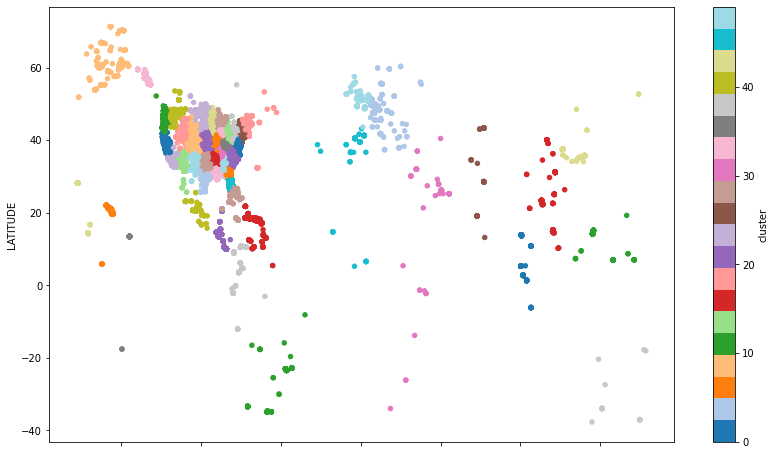

In [30]:
# plot the clusters
Xkm.plot(x='LONGITUDE',
         y='LATITUDE',
         kind='scatter',
         c='cluster',
         colormap='tab20',
         figsize=(14, 8))
plt.show()

That will do for starters.

In [31]:
# transfer the  clusters to the main dataframe
df['cluster'] = Xkm['cluster']

In [32]:
# score the clusters
c_score = df.groupby('cluster', as_index=False).agg(d_count=('INDICATED_DAMAGE', 'sum'))
c_score['c_score'] = round((c_score['d_count'] / c_score['d_count'].sum()) * 100, 2)
c_score.head()

,cluster,d_count,c_score
0,0,1041,7.28
1,1,1084,7.58
2,2,4,0.03
3,3,502,3.51
4,4,35,0.24


In [33]:
# transfer the c_score to the main dataframe
df['c_score'] = df.cluster.map(c_score.set_index('cluster')['c_score'].to_dict())

### Get a quick overview of the remaining data   
It is going to take too long going through the columns a few at a time. However, we can use Pandas profiling library to generate minimal summary statistics for all the data. Which will help narrow down to the columns I need to work further with.
  
I'm going to send the report to html to make it easier to open separately and refer too whilst I write the next few cells.  
If you want to see it in the notebook replace the `.to_file('....html')` with `.to_notebook_iframe()`

In [34]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title="Pandas Profiling Report", minimal=True)
profile.to_file("data_profiling_report.html") # to_notebook_iframe()

Export report to file: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


#### Notes on the overview of the data   
As the columns were classified into groups [Drop, Keep, Post, A_Type] and investigated in the notebook cells below, they were also annotated in the `column_description_with_comments.csv` file, for easy reference. This file will be loaded in to obtain the groupings. 
  
*A - First the ALerts tab information*   
1. There are 4 columns with constant values these will be added to the drop list.  
2. The number of high cardinality categorical features is worrying for a logistic regression model, especially as many of them have ~2500 values, that is a lot of one hot encoded columns! Normally this would be a signal to go and use a tree based model, however that is out of scope for this project. **TODO** Reduce the dimensionality of the model data explore ways to avoid one hot encoding the high cardinality categorical features.
3. REG (Aircraft registration) will be dropped as it is has too many unique values. And we want to be able to predict for any aircraft.
4. The COST_.. columns are data from after the incident, they will be added to the post_incident data list. Other columns that are clearly post incident will be added as I spot them.  
5. Note the high number of columns with missing values these will have to be imputed or the rows dropped in the those I select to keep. **TODO** Is there a relationship between the missing values and INCIDENT_DAMAGE?
6. FLT, EMO, AMO need further investigation due to the unsupported data types. **TODO**
  
*B - Second the Overview tab information*  
1. INDEX_NR is the index of the original data set. Drop.
2. INCIDENT_DATE to too cardinal, might be worth extracting the day of the week from. Drop for now.
3. INCIDENT_MONTH looks like there is some seasonality to the data with more records in mid/late summer. Currently integers but it is categorical. **TODO** convert to Categorical or score   
4. INCIDENT_YEAR Increasing records in each year, integer, but categorical. **TODO** convert to Categorical or score  
5. TIME in hours minutes format, datatype was not recognised on import. Nearly half of the data is missing.  Did the record keeping change over time? Are the high number of missing values due to changes in data collection? **TODO** groupby year isnull count  **TODO** convert to Categorical or score  
6. There appear to be many columns that describe the size, shape and type of aircraft. I'm sure we don't need them all. **TODO** Reduce the aircraft description columns.

In [35]:
# Notes on the data A.6
df['FLT'].value_counts(dropna=False)
# Drop

NaN        124845
301            95
1              84
3              80
503            71
            ...  
1471/12         1
1309/7          1
1810/7          1
7163            1
763A            1
Name: FLT, Length: 10307, dtype: int64

In [36]:
# Notes on the data A.6
df['EMO'].value_counts(dropna=False)
# Drop

NaN    80940
01     24503
1.0    21469
10     18072
4.0    12940
       ...  
n7         1
O1         1
42         1
N4         1
47         1
Name: EMO, Length: 102, dtype: int64

In [37]:
# Notes on the data A.6
df['AMO'].value_counts(dropna=False)
# Drop

NaN     73627
10.0    10945
42.0    10497
3.0      9652
24.0     8255
        ...  
451         1
N33         1
93.0        1
E2          1
N16         1
Name: AMO, Length: 119, dtype: int64

In [38]:
# Notes on data B.5. TODO groupby year is null count. 
# Did the record keeping change over time?
# get the record count for each year
records = df.groupby('INCIDENT_YEAR').count()
records_percent = records.divide(records.INDEX_NR, axis=0)
records_percent
# The use of TIME and TIME OF DAY appear to inversely correlated in their use, 
# .... maybe I can fill the missing values in one with the other? 
# TODO repeat when with the final data set and graph the results

,INDEX_NR,INCIDENT_DATE,INCIDENT_MONTH,TIME,TIME_OF_DAY,AIRPORT_ID,AIRPORT,LATITUDE,LONGITUDE,RUNWAY,...,NR_FATALITIES,COMMENTS,REPORTED_NAME,REPORTED_TITLE,SOURCE,PERSON,LUPDATE,TRANSFER,cluster,c_score
INCIDENT_YEAR,,,,,,,,,,,,,,,,,,,,,
1990,1.0,1.0,1.0,0.127497,0.892479,1.0,1.0,1.0,1.0,0.298472,...,0.000000,0.899530,1.0,1.0,1.0,0.635723,1.0,1.0,1.0,1.0
1991,1.0,1.0,1.0,0.022932,0.843525,1.0,1.0,1.0,1.0,0.446043,...,0.000000,0.909622,1.0,1.0,1.0,0.664119,1.0,1.0,1.0,1.0
1992,1.0,1.0,1.0,0.022158,0.836684,1.0,1.0,1.0,1.0,0.583915,...,0.000000,0.904801,1.0,1.0,1.0,0.691834,1.0,1.0,1.0,1.0
1993,1.0,1.0,1.0,0.028733,0.824363,1.0,1.0,1.0,1.0,0.626872,...,0.000000,0.913800,1.0,1.0,1.0,0.704978,1.0,1.0,1.0,1.0
1994,1.0,1.0,1.0,0.038385,0.834066,1.0,1.0,1.0,1.0,0.659336,...,0.000000,0.935626,1.0,1.0,1.0,0.685726,1.0,1.0,1.0,1.0
1995,1.0,1.0,1.0,0.022798,0.828053,1.0,1.0,1.0,1.0,0.664992,...,0.000000,0.927743,1.0,1.0,1.0,0.675425,1.0,1.0,1.0,1.0
1996,1.0,1.0,1.0,0.035011,0.795040,1.0,1.0,1.0,1.0,0.707148,...,0.000000,0.896791,1.0,1.0,1.0,0.721007,1.0,1.0,1.0,1.0
1997,1.0,1.0,1.0,0.045039,0.786772,1.0,1.0,1.0,1.0,0.752756,...,0.000000,0.891339,1.0,1.0,1.0,0.728504,1.0,1.0,1.0,1.0
1998,1.0,1.0,1.0,0.301042,0.759504,1.0,1.0,1.0,1.0,0.807941,...,0.000000,0.894114,1.0,1.0,1.0,0.729372,1.0,1.0,1.0,1.0


## Load sub sections of the data  


In [39]:
# Load the new column description file
cols_df = pd.read_csv('column_description_with_comments.csv')
cols_df.head()

,Action,Column Name,Explanation of Column Name and Codes
0,A_Type,AC_CLASS,Type of aircraft (see Aircraft Type tab below)
1,A_Type,AC_MASS,"1 = 2,250 kg or less: 2 = ,2251-5700 kg: 3 = 5..."
2,A_Type,AIRCRAFT,Aircraft
3,A_Type,AMA,International Civil Aviation Organization code...
4,A_Type,AMO,International Civil Aviation Organization code...


### Aircraft Type Data  
There are multiple columns that describe the aircraft type. I'm going to explore these and see which would be the best one/ combination to keep.  

In [40]:
a_type_cols = cols_df[cols_df['Action']=='A_Type']['Column Name'].to_list()
a_type = df[a_type_cols].copy()
profile_detailed = ProfileReport(a_type , title="Aircraft Type Columns", explorative=True)
# send to html to save memory and make it easier to read
profile_detailed.to_file('a_type_data_profile.html')  # to_notebook_iframe()

Summarize dataset:  67%|██████▋   | 16/24 [00:07<00:02,  2.88it/s, Calculate kendall correlation] g:\My Drive\Python\job applications\Network Rail\nr_venv\lib\site-packages\scipy\stats\stats.py:4812: RuntimeWarning:

overflow encountered in longlong_scalars

Export report to file: 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


It looks like there is approximately 30% of the data with no aircraft type information. I think AC_MASS and possibly AC_CLASS will be the most useful for the first predictive model. But what are the different AC_CLASS aircraft?

In [41]:
a_type[a_type['AC_CLASS']=='B'].head()
# Helicopters

,AC_CLASS,AC_MASS,AIRCRAFT,AMA,AMO,EMA,ENG_1_POS,ENG_2_POS,ENG_3_POS,ENG_4_POS,NUM_ENGS,TYPE_ENG
647,B,2.0,AEROS SA365,031,14,44.0,6.0,NaN,NaN,NaN,2.0,F
1110,B,1.0,HUGHES 269A,478,01,7.0,7.0,NaN,NaN,NaN,1.0,A
1723,B,1.0,ROBINSON R22,762,01,7.0,6.0,NaN,NaN,NaN,1.0,A
2983,B,2.0,MBB-105,612,01,1.0,NaN,NaN,NaN,NaN,2.0,F
3234,B,1.0,ROBINSON R22,762,01,7.0,6.0,NaN,NaN,NaN,1.0,A


In [42]:
a_type[a_type['AC_CLASS']=='C'].head()
# Gliders

,AC_CLASS,AC_MASS,AIRCRAFT,AMA,AMO,EMA,ENG_1_POS,ENG_2_POS,ENG_3_POS,ENG_4_POS,NUM_ENGS,TYPE_ENG
173563,C,NaN,SCHWEIZER SGS 2-33,789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
176263,C,NaN,SCHWEIZER SGS 2-33,789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
247271,C,1.0,GLIDER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,E
247272,C,1.0,GLIDER,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,E


In [43]:
a_type[a_type['AC_CLASS']=='J'].head()

,AC_CLASS,AC_MASS,AIRCRAFT,AMA,AMO,EMA,ENG_1_POS,ENG_2_POS,ENG_3_POS,ENG_4_POS,NUM_ENGS,TYPE_ENG
16975,J,1.0,ULTRA LIGHT,998,6.0,NaN,NaN,NaN,NaN,NaN,1.0,A
155941,J,1.0,ULTRA LIGHT,998,06,NaN,NaN,NaN,NaN,NaN,1.0,A
221535,J,1.0,ULTRA LIGHT,998,6.0,NaN,NaN,NaN,NaN,NaN,1.0,A
238933,J,1.0,ULTRA LIGHT,998,6.0,NaN,NaN,NaN,NaN,NaN,1.0,A


In [44]:
a_type[a_type['AC_CLASS']=='Y'].head()

,AC_CLASS,AC_MASS,AIRCRAFT,AMA,AMO,EMA,ENG_1_POS,ENG_2_POS,ENG_3_POS,ENG_4_POS,NUM_ENGS,TYPE_ENG
233988,Y,5.0,SPACE SHUTTLE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y


## Predictive Model Data  

In [45]:
model_cols = cols_df[cols_df['Action']=='Keep']['Column Name'].to_list()
# add the aircraft type cols and the target label
model_cols.extend(['AC_CLASS', 'AC_MASS', 'INDICATED_DAMAGE', 'c_score'])
model_df = df[model_cols].copy()

In [46]:
model_df.columns

Index(['AIRPORT_ID', 'DISTANCE', 'ENROUTE_STATE', 'FAAREGION', 'HEIGHT',
       'INCIDENT_MONTH', 'INCIDENT_YEAR', 'LATITUDE', 'LOCATION', 'LONGITUDE',
       'OPID', 'PHASE_OF_FLIGHT', 'PRECIPITATION', 'RUNWAY', 'SKY', 'SPEED',
       'STATE', 'TIME', 'TIME_OF_DAY', 'WARNED', 'AC_CLASS', 'AC_MASS',
       'INDICATED_DAMAGE', 'c_score'],
      dtype='object')

In [47]:
profile_model = ProfileReport(model_df ,title="Model Data", explorative=True)
# send to html to save memory and make it easier to read
profile_model.to_file('model_data_profile.html')  # to_notebook_iframe()

Summarize dataset:  78%|███████▊  | 28/36 [00:08<00:02,  2.86it/s, Calculate kendall correlation]     g:\My Drive\Python\job applications\Network Rail\nr_venv\lib\site-packages\scipy\stats\stats.py:4812: RuntimeWarning:

overflow encountered in longlong_scalars

Export report to file: 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]


After reviewing the data above that I had earmarked for the model. I have decided that for the first model I am going to drop the categorical location data in favour of the Latitude and longitude c_score data. Partly because this is a time limited analysis and partly because of the type of model Logistic Regression does not particularly well with high cardinality categorical data. And the OPID operator ID data is not very useful for a generalised model.

In [48]:
model_df = model_df.drop([
    'AIRPORT_ID', 'ENROUTE_STATE', 'FAAREGION', 'LOCATION',
    'OPID', 'STATE', 'RUNWAY'
],
                            axis=1)

### Time Data  
Next I need to sort out the time value columns. Have damage reports changed over time? Is there any seasonality to the data? And can the time of day and   time columns be combined.

In [51]:
# damage trend over years
damage_over_time = model_df.groupby('INCIDENT_YEAR', 
                                    as_index=False).agg(reports=('INDICATED_DAMAGE','count'), 
                                                        damage=('INDICATED_DAMAGE','sum'))
damage_over_time['damage_percent'] = damage_over_time['damage'] / damage_over_time['reports']
# plot the damage over time trend
fig3 = px.line(damage_over_time, 
              x='INCIDENT_YEAR', 
              y='damage_percent', 
              title='Proportion of damage over time in submitted incident reports', 
              height=600, width=1000)
fig3.show()

Ok, so the number of reports is increasing over time (see the data profiled above), but the proportion of indicated damage is not. It has fallen dramatically from 1990's to approx. 2013 then remained more stable. This suggests that perhaps detection and avoidance of the bird strikes has improved over time. The increased number of reports can be explained by the increased air traffic, which is not obvious from this data, but widely reported.  
  
What about the number of indicated damage incidents over time?

In [52]:
fig4 = px.line(damage_over_time, 
              x='INCIDENT_YEAR', 
              y='damage', 
              title='The damage incidents over time', 
              height=600, width=1000)
fig4.show()

Hmm, no real trend for many years during the 2000's, a drop off in 2020, COVID I assume. I will remove the year data, as the aim of the model is to predict the number of bird strikes from in the future. 
  
What about the monthly seasonality?

In [56]:
damage_in_month = model_df.groupby('INCIDENT_MONTH', 
                                    as_index=False).agg(reports=('INDICATED_DAMAGE','count'), 
                                                        damage=('INDICATED_DAMAGE','sum'))
fig5 = px.bar(damage_in_month, 
              x='INCIDENT_MONTH', 
              y='damage', 
              title='The damage incidents per month', 
              height=600, width=1000)
fig5.show()

There is some significant seasonality in the data. I will remove the month categories and replace them with a score.

In [54]:
# create a variable to replace the categorical values with
damage_in_month['damage_norm'] = round(damage_in_month['damage'] / damage_in_month['damage'].sum() *100, 2)
# create a dictionary to map the values to
damage_in_month.set_index('INCIDENT_MONTH', inplace=True)
month_dict = damage_in_month['damage_norm'].to_dict()
month_dict

{1: 5.8,
 2: 5.15,
 3: 8.64,
 4: 8.43,
 5: 7.15,
 6: 5.83,
 7: 7.17,
 8: 9.52,
 9: 11.03,
 10: 12.82,
 11: 11.49,
 12: 6.96}

In [55]:
# map the incident month to the month dictionary
model_df['month_score'] = model_df['INCIDENT_MONTH'].map(month_dict)

What about the TIME?

In [57]:
damage_in_time = model_df.groupby('TIME', 
                                    as_index=False).agg(reports=('INDICATED_DAMAGE','count'), 
                                                        damage=('INDICATED_DAMAGE','sum'))
fig6 = px.line(damage_in_time, 
              x='TIME', 
              y='damage', 
              title='The damage incidents per time', 
              height=600, width=1000)
fig6.show()

In [58]:
model_df['HOUR'] = model_df['TIME'].apply(lambda x: str(x).split(':')[0])

In [59]:
damage_in_hour = model_df.groupby('HOUR', 
                                    as_index=False).agg(reports=('INDICATED_DAMAGE','count'), 
                                                        damage=('INDICATED_DAMAGE','sum'))
fig7 = px.line(damage_in_hour, 
              x='HOUR', 
              y='damage', 
              title='The damage incidents per hour', 
              height=600, width=1000)
fig7.show()

In [60]:
damage_in_hour.HOUR.replace(
    {
        '-1': '01',
        '-9': '09',
        '0-': '00',
        '1': '01',
        '6': '06',
        '7': '07',
        '8': '08',
        '9': '09'
    },
    inplace=True)
damage_in_hour

,HOUR,reports,damage
0,01,2,0
1,09,1,0
2,00,1,0
3,00,2422,138
4,01,1459,103
5,02,970,67
6,03,899,61
7,04,1278,75
8,05,1834,115
9,06,4697,294


In [61]:
type(damage_in_hour.loc[32]['HOUR'])

str

In [62]:
# drop the nan row
damage_in_hour = damage_in_hour.iloc[:32, :].copy()
damage_in_hour.HOUR = damage_in_hour.HOUR.astype(int)
fig8 = px.bar(damage_in_hour,
               x='HOUR',   
               y='damage',
               title='The damage incidents per hour',
               height=600,
               width=1000)
fig8.show()

TIME OF DAY

In [64]:
damage_in_timeD = model_df.groupby('TIME_OF_DAY',
                                    as_index=False).agg(reports=('INDICATED_DAMAGE','count'), 
                                                        damage=('INDICATED_DAMAGE','sum'))
fig9 = px.bar(damage_in_timeD, 
              x='TIME_OF_DAY',
              y='damage', 
              title='The damage incidents per time of day', 
              height=600, width=1000)
fig9.show()

Interestingly the TIME column and the TIME OF DAY column contradict each other at Dusk. Maybe it is the number of hours that people consider to be Dusk or day creating different size bins? 

In [65]:
model_df.dropna().groupby('TIME_OF_DAY', as_index=False).agg(times=('HOUR', 'unique'))

,TIME_OF_DAY,times
0,Dawn,"[06, 07, 05, 09, 08, 18, 10, 04, 00, 03, 02, 1..."
1,Day,"[19, 08, 06, 17, 20, 11, 09, 13, 16, 18, 15, 1..."
2,Dusk,"[18, 19, 14, 17, 20, 21, 16, 22, 15, 23, 07, 1..."
3,Night,"[19, 21, 22, 16, 18, 01, 00, 20, 23, 03, 12, 0..."


There may be timezone differences in sunset and sunrise times, but this TIME_OF_DAY data looks unreliable. I will remove it. The FAA form states that the time should be local time so it is not a conversion to GMT or similar. The incidents per hour chart looks to have sensible trends as well.

In [66]:
model_df.drop('TIME_OF_DAY', axis=1, inplace=True)

In [67]:
# create a variable to replace the categorical time values with
damage_in_hour['damage_norm'] = round(damage_in_hour['damage'] / damage_in_hour['damage'].sum() * 100, 2)
# create a dictionary to map the values to
damage_in_hour.HOUR = damage_in_hour.HOUR.astype(str)
damage_in_hour.set_index('HOUR', inplace=True)
hour_dict = damage_in_hour['damage_norm'].to_dict()
hour_dict

{'1': 0.0,
 '9': 0.0,
 '0': 1.57,
 '2': 0.76,
 '3': 0.69,
 '4': 0.85,
 '5': 1.31,
 '6': 0.0,
 '7': 0.0,
 '8': 0.0,
 '10': 5.55,
 '11': 5.74,
 '12': 5.1,
 '13': 4.58,
 '14': 4.78,
 '15': 4.83,
 '16': 4.61,
 '17': 6.09,
 '18': 6.14,
 '19': 6.1,
 '20': 6.84,
 '21': 6.26,
 '22': 4.44,
 '23': 3.63}

In [68]:
# clean the time data in the main dataframe
model_df.HOUR.replace(
    {
        '-1': '01',
        '-9': '09',
        '0-': '00',
        '1': '01',
        '6': '06',
        '7': '07',
        '8': '08',
        '9': '09'
    },
    inplace=True)
# map the incident month to the month dictionary
model_df['hour_score'] = model_df['HOUR'].map(hour_dict)

In [69]:
model_df.drop(['TIME', 'HOUR'], axis=1, inplace=True)

In [70]:
# remove the lother time based columns
model_df.drop(['INCIDENT_MONTH', 'INCIDENT_YEAR'], axis=1, inplace=True)

### Prepare the other columns 

In [71]:
# convert WARNED to a boolean
model_df['WARNED'] = np.where(model_df['WARNED']=='Yes', 1, 0)
# Fill AC_MASS with the median value
model_df['AC_MASS'] = model_df['AC_MASS'].fillna(model_df['AC_MASS'].median())
# simplify PRECIPITATION 
model_df['PRECIPITATION'].fillna('None', inplace=True)
model_df['PRECIPITATION'] = np.where(model_df['PRECIPITATION']!='None', 1, 0)
# impute SKY
model_df['SKY'].fillna('Unknown', inplace=True)

In [72]:
# get dummies for the categorical variables
model_df = pd.get_dummies(model_df, columns=['SKY', 'AC_CLASS', 'PHASE_OF_FLIGHT'], drop_first=True, dummy_na=True)

In [73]:
model_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 213775 entries, 0 to 255908
Data columns (total 32 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   DISTANCE                      154227 non-null  float64
 1   HEIGHT                        126292 non-null  float64
 2   LATITUDE                      213775 non-null  float64
 3   LONGITUDE                     213775 non-null  float64
 4   PRECIPITATION                 213775 non-null  int32  
 5   SPEED                         80745 non-null   float64
 6   WARNED                        213775 non-null  int32  
 7   AC_MASS                       213775 non-null  float64
 8   INDICATED_DAMAGE              213775 non-null  bool   
 9   c_score                       213775 non-null  float64
 10  month_score                   213775 non-null  float64
 11  hour_score                    76709 non-null   float64
 12  SKY_Overcast                  213775 non-nul

Before doing lots of imputing I want to see how the model works with the orginal data. By dropping the Nan's and seeing if there is enough data to build and test a model. It will be quicker to perform grid searches and parameter optimisation on the smaller dataset. Once the model parameters have been found, the feature importance will tell us if it is worth imputing some of the data to expand the training set. 

### Drop NAN  

In [74]:
clean_df = model_df.dropna()

In [75]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23948 entries, 16 to 255382
Data columns (total 32 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   DISTANCE                      23948 non-null  float64
 1   HEIGHT                        23948 non-null  float64
 2   LATITUDE                      23948 non-null  float64
 3   LONGITUDE                     23948 non-null  float64
 4   PRECIPITATION                 23948 non-null  int32  
 5   SPEED                         23948 non-null  float64
 6   WARNED                        23948 non-null  int32  
 7   AC_MASS                       23948 non-null  float64
 8   INDICATED_DAMAGE              23948 non-null  bool   
 9   c_score                       23948 non-null  float64
 10  month_score                   23948 non-null  float64
 11  hour_score                    23948 non-null  float64
 12  SKY_Overcast                  23948 non-null  uint8  
 13 

Wow, not much data left.  
### Clean up some memory 

Normally I would have lots of smaller notebooks open, rather than doing it all in one. However, I am going to clear out some memory to carry on in this one.As I think only one notebook is supposesd to be submitted. 

In [76]:
# turn the large df's in memory into empty dataframes
a_type = pd.DataFrame()
df = pd.DataFrame()
unknown_locations = pd.DataFrame()
Xkm = pd.DataFrame()
val_df = pd.DataFrame()
simple_data = pd.DataFrame()

## Start Modeling the data 

In [77]:
from sklearn.model_selection import train_test_split

X = clean_df.drop(['INDICATED_DAMAGE'], axis=1)
y = clean_df['INDICATED_DAMAGE'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

### Model 1

In [119]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold, StratifiedKFold
from sklearn.metrics import auc, roc_curve, RocCurveDisplay
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import seaborn as sns

In [79]:
def plot_confusion_matrix(y_true, y_pred, classes, normalize=None):
    """Plots a confusion matrix. using seaborn

    Args:
        y_true (numpy array): the true class labels
        y_pred (numpy array): the predicted class labels
        classes (list): the class labels
        normalize must be one of {'true', 'pred', 'all', None}
    """
    # check the format of the y_true and y_pred
    if len(y_true.shape) > 1:
        y_true = np.argmax(y_true, axis=1)
    if len(y_pred.shape) > 1:
        y_pred = np.argmax(y_pred, axis=1)
    # plot the confusion matrix
    plt.figure(figsize=(10, 7))
    data = confusion_matrix(y_true, y_pred, normalize=normalize)
    df_cm = pd.DataFrame(data, columns=classes, index=classes)
    df_cm.index.name = 'Actual'
    df_cm.columns.name = 'Predicted'
    sns.set(font_scale=1.4)
    sns.heatmap(df_cm, cmap="Blues", annot=True, annot_kws={"size": 16}, fmt='g')
    plt.title('Confusion Matrix')
    # set the number format
    plt.show()
    # return df_cm

#### Simple Logistic Regression Model  

In [80]:
model = LogisticRegression(solver='lbfgs', max_iter=1000)
model.fit(X_train, y_train)
model.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 1000,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [81]:
y_preds = model.predict_proba(X_test)[:,1]

AUC:  0.7050672400693173


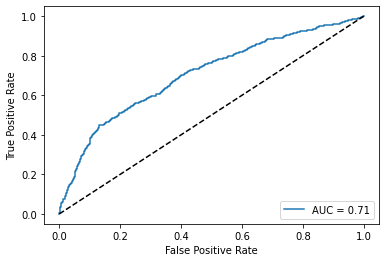

In [82]:
%matplotlib inline
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()


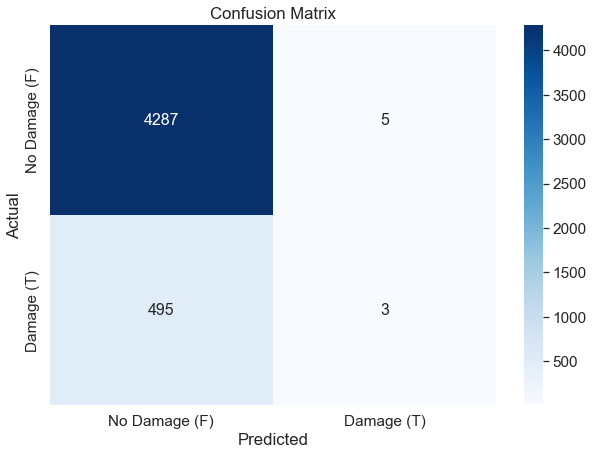

In [83]:
plot_confusion_matrix(y_test, y_preds.round(), classes=['No Damage (F)', 'Damage (T)'])

Poor!!

In [84]:
print(classification_report(y_test, y_preds.round()))

              precision    recall  f1-score   support

       False       0.90      1.00      0.94      4292
        True       0.38      0.01      0.01       498

    accuracy                           0.90      4790
   macro avg       0.64      0.50      0.48      4790
weighted avg       0.84      0.90      0.85      4790



#### Add Class weights  
The data is imbalanced, test different class weights to see if the model improves before testing the other parameters. I have also forgotten how the class weights work!

In [85]:
model_weighted = LogisticRegression(solver='lbfgs', 
                                    max_iter=1000)
weights_dict = [{False: 0.928, True: 0.0720}, 
                {False: 1/0.928, True: 1/0.0720}, 
                {False: 1, True: 9},
                {False: 9, True: 1},
                {False: 0.9, True: 0.1},
                {False: 0.1, True: 0.9}]
param_grid = dict(class_weight=weights_dict)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=0)
grid = GridSearchCV(model_weighted, param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)

grid_result = grid.fit(X_train, y_train)
print(f'Best score: {grid_result.best_score_}\nBest params: {grid_result.best_params_}')

Best score: 0.7120695426665424
Best params: {'class_weight': {False: 1, True: 9}}


Ok slightly better, than before 0.70 vs 0.71

In [86]:
# see how the weights worked
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f"{mean} ({stdev}) with: {param}")

0.6880782872093716 (0.018027637607949388) with: {'class_weight': {False: 0.928, True: 0.072}}
0.7107280628511125 (0.017357207389945055) with: {'class_weight': {False: 1.0775862068965516, True: 13.88888888888889}}
0.7120695426665424 (0.01872639310120592) with: {'class_weight': {False: 1, True: 9}}
0.6912128857855466 (0.017386375444974372) with: {'class_weight': {False: 9, True: 1}}
0.6905394225412995 (0.018542359076689427) with: {'class_weight': {False: 0.9, True: 0.1}}
0.7115146449255207 (0.019268582266797896) with: {'class_weight': {False: 0.1, True: 0.9}}


In [87]:
model_weighted = LogisticRegression(solver='lbfgs', 
                                    max_iter=1000,
                                    class_weight={False: 0.1, True: 0.9})
model_weighted.fit(X_train, y_train)

LogisticRegression(class_weight={False: 0.1, True: 0.9}, max_iter=1000)

AUC:  0.7176249265468211


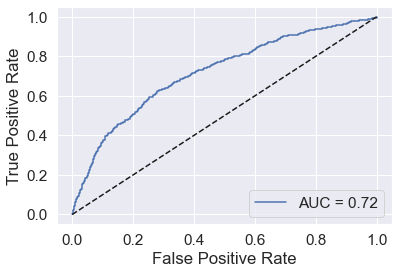

In [88]:
y_preds = model_weighted.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()

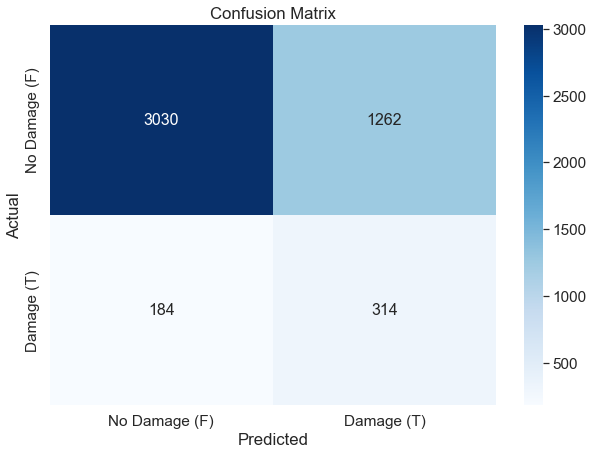

In [89]:
plot_confusion_matrix(y_test, y_preds.round(), classes=['No Damage (F)', 'Damage (T)'])

In [90]:
print(classification_report(y_test, y_preds.round()))

              precision    recall  f1-score   support

       False       0.94      0.71      0.81      4292
        True       0.20      0.63      0.30       498

    accuracy                           0.70      4790
   macro avg       0.57      0.67      0.56      4790
weighted avg       0.87      0.70      0.75      4790



I think that is an improvement, the overall accuracy has dropped off, but the recall has improved. For safety reasons we would rather have false positives than false negatives. So it is going in the right direction.

#### Does Scaling the data have any effect?

In [91]:
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)

model_scaled = LogisticRegression(solver='lbfgs', 
                                  max_iter=1000,
                                 class_weight={False: 0.1, True: 0.9})
model_scaled.fit(X_train_s, y_train)

LogisticRegression(class_weight={False: 0.1, True: 0.9}, max_iter=1000)

AUC:  0.7177694936315625


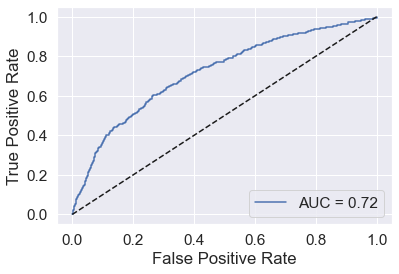

In [92]:
y_preds = model_scaled.predict_proba(X_test_s)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()

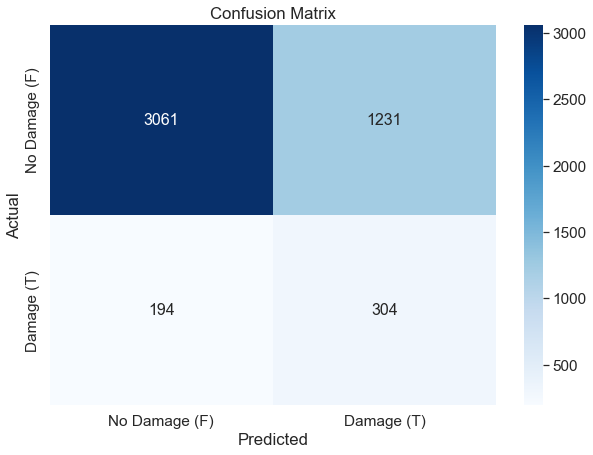

In [93]:
plot_confusion_matrix(y_test, y_preds.round(), classes=['No Damage (F)', 'Damage (T)'])

In [94]:
print(classification_report(y_test, y_preds.round()))

              precision    recall  f1-score   support

       False       0.94      0.71      0.81      4292
        True       0.20      0.61      0.30       498

    accuracy                           0.70      4790
   macro avg       0.57      0.66      0.56      4790
weighted avg       0.86      0.70      0.76      4790



Scaling gave a tiny improvement in the AUC, but the number of collisions when we predicted no collision went up! Which is the reverse of the way we are looking to bias the model for safety.So I will not scale the data.

#### Param Optimisation  
Randomised first with a wide space.

In [95]:
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'max_iter': [100, 500, 1000],
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
}
model = LogisticRegression(class_weight={
                                        False: 0.1,
                                        True: 0.9
                                        },
                           random_state=0)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=0)
grid = RandomizedSearchCV(model, param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)

grid_result = grid.fit(X_train, y_train)
print(
    f'Best score: {grid_result.best_score_}\nBest params: {grid_result.best_params_}'
)


g:\My Drive\Python\job applications\Network Rail\nr_venv\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning:


90 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "g:\My Drive\Python\job applications\Network Rail\nr_venv\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "g:\My Drive\Python\job applications\Network Rail\nr_venv\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "g:\My Drive\Python\job application

Best score: 0.712373914541692
Best params: {'solver': 'newton-cg', 'penalty': 'l2', 'max_iter': 500, 'C': 100}


Ok, switch to liblinear and l1, with these parameters. The AUC is still poor and the parameters did little to improve it. Suggesting all the improvement is come from the data.  
**NOTE** the result changes each time the notebook is run. Adding weight to the importance of the data over the model parameters.

AUC:  0.7165708500357442


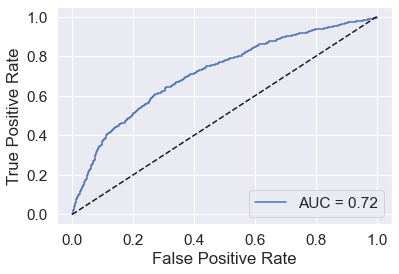

In [96]:
# check this model is about the same as the earlier best model
model = LogisticRegression(class_weight={False: 0.1, True: 0.9},
                           solver='liblinear', 
                           penalty='l1', 
                           max_iter= 100, 
                           random_state=0)
model.fit(X_train, y_train)

y_preds = model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()

Worse! go back to the weighted lbfgs model.

AUC:  0.7176249265468211


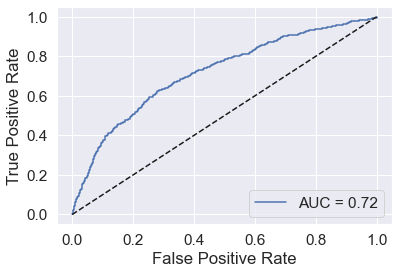

In [97]:
model_weighted = LogisticRegression(solver='lbfgs', 
                                    max_iter=1000,
                                    class_weight={False: 0.1, True: 0.9})
model_weighted.fit(X_train, y_train)
y_preds = model_weighted.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()

## Feature Importance  

In [102]:
feature_importance = pd.DataFrame(model.coef_[0], X_train.columns, columns=['coef'])
# add the scores to the dataframe
feature_importance['score'] = feature_importance.iloc[:,0].abs()
# sort the dataframe by the score
feature_importance = feature_importance.sort_values(by='score', ascending=False)
# the top 10 features
feature_importance.head(5)


,coef,score
AC_MASS,-0.747179,0.747179
PHASE_OF_FLIGHT_Descent,-0.433762,0.433762
PHASE_OF_FLIGHT_Climb,0.304939,0.304939
PHASE_OF_FLIGHT_Take-off Run,0.279451,0.279451
AC_CLASS_B,-0.214277,0.214277


<AxesSubplot:>

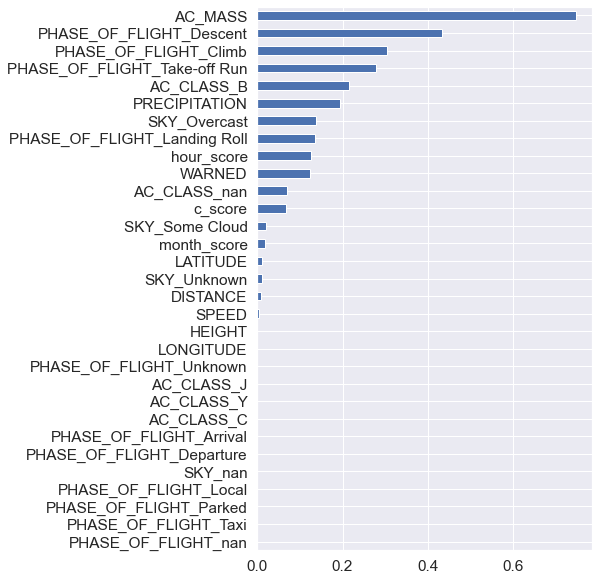

In [99]:
# plot the scores - flip the dataframe as barh always plots the wrong way round
feature_importance.sort_values(by='score',
                               ascending=True).score.plot(kind='barh',
                                                          legend=False,
                                                          figsize=(6, 10))


Brilliant that gives me something to work with and opens up the amount of data we can use. I'm going to take the top 16 features. That means the cut is at DISTANCE, which is covered by the PHASE_OF_FLIGHT features anyway.

<AxesSubplot:title={'center':'Feature Importance and Direction of Effect\n'}>

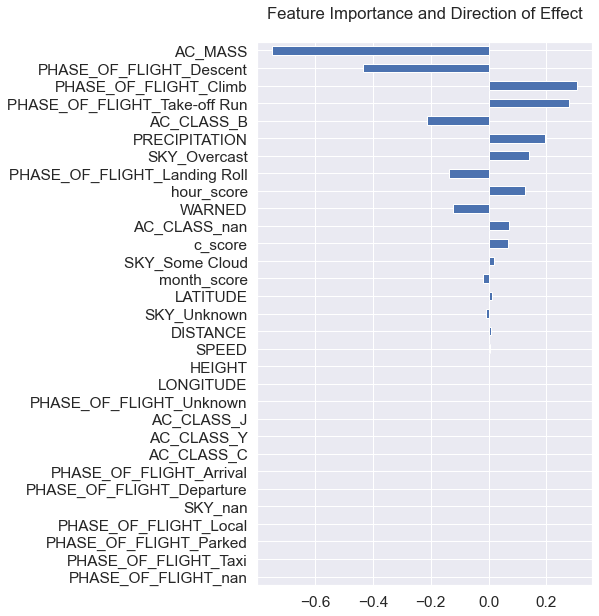

In [105]:
# plot the scores - flip the dataframe as barh always plots the wrong way round
feature_importance.sort_values(by='score',
                               ascending=True).coef.plot(kind='barh',
                                                          legend=False,
                                                          figsize=(6, 10),
                                                          title='Feature Importance and Direction of Effect\n')

In [106]:
features = feature_importance.head(16).index.tolist()

### Prepare the data  

Go back to the original data and select the features I want to use. Hopefully ending up with a larger dataset to model on.

In [107]:
features.append('INDICATED_DAMAGE')
model_df[features].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 213775 entries, 0 to 255908
Data columns (total 17 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   AC_MASS                       213775 non-null  float64
 1   PHASE_OF_FLIGHT_Descent       213775 non-null  uint8  
 2   PHASE_OF_FLIGHT_Climb         213775 non-null  uint8  
 3   PHASE_OF_FLIGHT_Take-off Run  213775 non-null  uint8  
 4   AC_CLASS_B                    213775 non-null  uint8  
 5   PRECIPITATION                 213775 non-null  int32  
 6   SKY_Overcast                  213775 non-null  uint8  
 7   PHASE_OF_FLIGHT_Landing Roll  213775 non-null  uint8  
 8   hour_score                    76709 non-null   float64
 9   WARNED                        213775 non-null  int32  
 10  AC_CLASS_nan                  213775 non-null  uint8  
 11  c_score                       213775 non-null  float64
 12  SKY_Some Cloud                213775 non-nul

To use hour_score or not? First I will try to use the hour_score. And then compare to the full data without it.  

### With hour_score  

In [108]:
hour_df = model_df[features].dropna()

X = hour_df.drop(['INDICATED_DAMAGE'], axis=1)
y = hour_df['INDICATED_DAMAGE'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
X.info()

(61367, 16) (15342, 16) (61367,) (15342,)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 76709 entries, 16 to 255907
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   AC_MASS                       76709 non-null  float64
 1   PHASE_OF_FLIGHT_Descent       76709 non-null  uint8  
 2   PHASE_OF_FLIGHT_Climb         76709 non-null  uint8  
 3   PHASE_OF_FLIGHT_Take-off Run  76709 non-null  uint8  
 4   AC_CLASS_B                    76709 non-null  uint8  
 5   PRECIPITATION                 76709 non-null  int32  
 6   SKY_Overcast                  76709 non-null  uint8  
 7   PHASE_OF_FLIGHT_Landing Roll  76709 non-null  uint8  
 8   hour_score                    76709 non-null  float64
 9   WARNED                        76709 non-null  int32  
 10  AC_CLASS_nan                  76709 non-null  uint8  
 11  c_score                       76709 non-null  float64
 12  SKY_Some Cloud  

AUC:  0.7059958781285738


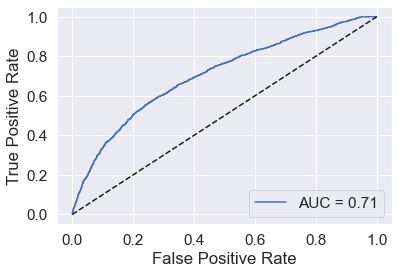

In [109]:
model = LogisticRegression(solver='lbfgs', 
                           max_iter=1000,
                          class_weight={False: 0.1, True: 0.9})
model.fit(X_train, y_train)
y_preds = model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()

No better, try the full data without the hour_score.

### Drop the hour_score

In [110]:
features.remove('hour_score')
full_df = model_df[features].dropna()

In [111]:
X = full_df.drop(['INDICATED_DAMAGE'], axis=1)
y = full_df['INDICATED_DAMAGE'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
X.info()

(171020, 15) (42755, 15) (171020,) (42755,)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 213775 entries, 0 to 255908
Data columns (total 15 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   AC_MASS                       213775 non-null  float64
 1   PHASE_OF_FLIGHT_Descent       213775 non-null  uint8  
 2   PHASE_OF_FLIGHT_Climb         213775 non-null  uint8  
 3   PHASE_OF_FLIGHT_Take-off Run  213775 non-null  uint8  
 4   AC_CLASS_B                    213775 non-null  uint8  
 5   PRECIPITATION                 213775 non-null  int32  
 6   SKY_Overcast                  213775 non-null  uint8  
 7   PHASE_OF_FLIGHT_Landing Roll  213775 non-null  uint8  
 8   WARNED                        213775 non-null  int32  
 9   AC_CLASS_nan                  213775 non-null  uint8  
 10  c_score                       213775 non-null  float64
 11  SKY_Some Cloud                213775 non-null  uint8  
 12  

AUC:  0.779692260365277


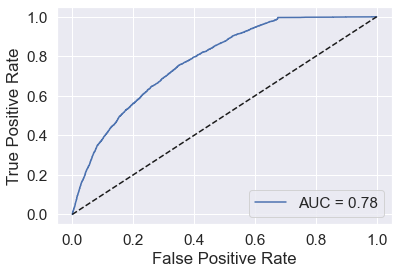

In [112]:
model = LogisticRegression(solver='lbfgs', 
                           max_iter=1000,
                          class_weight={False: 0.1, True: 0.9})
model.fit(X_train, y_train)
y_preds = model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()

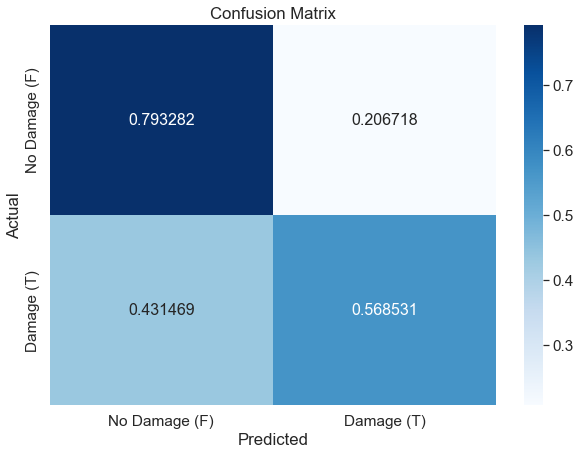

In [113]:
plot_confusion_matrix(y_test, y_preds.round(), classes=['No Damage (F)', 'Damage (T)'], 
                      normalize='true')

In [114]:
print(classification_report(y_test, y_preds.round()))

              precision    recall  f1-score   support

       False       0.96      0.79      0.87     39895
        True       0.16      0.57      0.26      2860

    accuracy                           0.78     42755
   macro avg       0.56      0.68      0.56     42755
weighted avg       0.91      0.78      0.83     42755



Much better, but still not a good model. What if I reduce the number of features further?

### Top Eight features

In [115]:
feature_importance.head(8)

,coef,score
AC_MASS,-0.747179,0.747179
PHASE_OF_FLIGHT_Descent,-0.433762,0.433762
PHASE_OF_FLIGHT_Climb,0.304939,0.304939
PHASE_OF_FLIGHT_Take-off Run,0.279451,0.279451
AC_CLASS_B,-0.214277,0.214277
PRECIPITATION,0.193692,0.193692
SKY_Overcast,0.138749,0.138749
PHASE_OF_FLIGHT_Landing Roll,-0.135128,0.135128


In [116]:
top8 = feature_importance.head(8).index.tolist()
top8.append('INDICATED_DAMAGE')
top8_df = model_df[top8].dropna()

X = top8_df.drop(['INDICATED_DAMAGE'], axis=1)
y = top8_df['INDICATED_DAMAGE'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
X.info()

(171020, 8) (42755, 8) (171020,) (42755,)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 213775 entries, 0 to 255908
Data columns (total 8 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   AC_MASS                       213775 non-null  float64
 1   PHASE_OF_FLIGHT_Descent       213775 non-null  uint8  
 2   PHASE_OF_FLIGHT_Climb         213775 non-null  uint8  
 3   PHASE_OF_FLIGHT_Take-off Run  213775 non-null  uint8  
 4   AC_CLASS_B                    213775 non-null  uint8  
 5   PRECIPITATION                 213775 non-null  int32  
 6   SKY_Overcast                  213775 non-null  uint8  
 7   PHASE_OF_FLIGHT_Landing Roll  213775 non-null  uint8  
dtypes: float64(1), int32(1), uint8(6)
memory usage: 5.3 MB


AUC:  0.7308752170251106


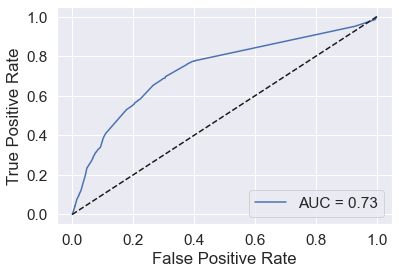

In [117]:
model = LogisticRegression(solver='lbfgs', 
                           max_iter=1000,
                          class_weight={False: 0.1, True: 0.9})
model.fit(X_train, y_train)
y_preds = model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()

Worse !. I will stick with the top 16 features without the hour_score. The model development could go on longer but I think I will stop here, after a gridsearch for the best C, weights and iterations. Then do a final probability adjustment to reduce the false positives. And finally see how the model performs the hold out 2021 dataset.

## Final Model

In [118]:
X = full_df.drop(['INDICATED_DAMAGE'], axis=1)
y = full_df['INDICATED_DAMAGE'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
X.info()


(171020, 15) (42755, 15) (171020,) (42755,)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 213775 entries, 0 to 255908
Data columns (total 15 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   AC_MASS                       213775 non-null  float64
 1   PHASE_OF_FLIGHT_Descent       213775 non-null  uint8  
 2   PHASE_OF_FLIGHT_Climb         213775 non-null  uint8  
 3   PHASE_OF_FLIGHT_Take-off Run  213775 non-null  uint8  
 4   AC_CLASS_B                    213775 non-null  uint8  
 5   PRECIPITATION                 213775 non-null  int32  
 6   SKY_Overcast                  213775 non-null  uint8  
 7   PHASE_OF_FLIGHT_Landing Roll  213775 non-null  uint8  
 8   WARNED                        213775 non-null  int32  
 9   AC_CLASS_nan                  213775 non-null  uint8  
 10  c_score                       213775 non-null  float64
 11  SKY_Some Cloud                213775 non-null  uint8  
 12  

In [123]:
# Gridsearch
model = LogisticRegression(solver='lbfgs')

params_grid = {'class_weight' : [{False: 0.01, True: 0.99}, 
                                   {False: 0.05, True: 0.95}, 
                                   {False: 0.1, True: 0.9}],    
                'max_iter' : [100, 1000],
                'C' : [0.1, 1, 10, 100]
                }
# quick search with a hack to avoid cross validation
grid = GridSearchCV(model, params_grid, cv=[(slice(None), slice(None))], scoring='roc_auc', n_jobs=-1)

grid_result = grid.fit(X_train, y_train)
print(f'Best score: {grid_result.best_score_}\nBest params: {grid_result.best_params_}')

Best score: 0.77803662882111
Best params: {'C': 10, 'class_weight': {False: 0.05, True: 0.95}, 'max_iter': 1000}


AUC:  0.7795261424876664


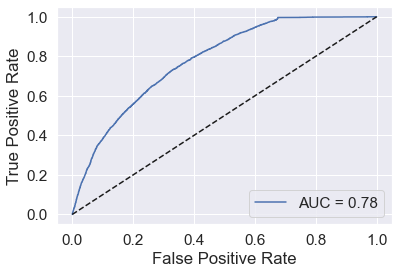

In [146]:
final_model = LogisticRegression(solver='lbfgs', 
                                C=10, 
                                class_weight={False: 0.05, True: 0.95}, 
                                max_iter=1000)
                          
final_model.fit(X_train, y_train)
y_preds = final_model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()

### Tunning the False Negative Rate with probability adjustment

In [147]:
for threshold in np.linspace(0.1, 0.9, 9):
    th_preds = y_preds >= threshold
    fpr, tpr, thresholds = roc_curve(y_test, th_preds)
    auc_output = auc(fpr, tpr)
    print(f'Threshold: {threshold} AUC: {auc_output}')

Threshold: 0.1 AUC: 0.6596918309162951
Threshold: 0.2 AUC: 0.6582437333314637
Threshold: 0.30000000000000004 AUC: 0.6573464478872425
Threshold: 0.4 AUC: 0.6633657669564426
Threshold: 0.5 AUC: 0.6779264099730324
Threshold: 0.6 AUC: 0.6940292349585494
Threshold: 0.7000000000000001 AUC: 0.6738952644047268
Threshold: 0.8 AUC: 0.6131283868406315
Threshold: 0.9 AUC: 0.5243047965945572


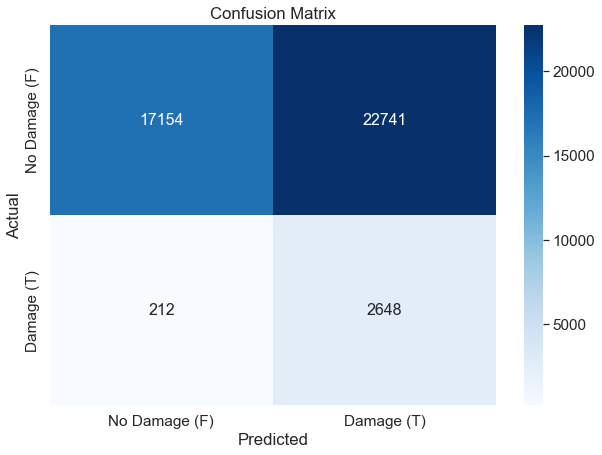

In [148]:
# rounded predictions >0.5
plot_confusion_matrix(y_test, y_preds.round(), 
                      classes=['No Damage (F)', 'Damage (T)'], 
                      normalize=None)

The new class weight looks like it has dropped the false negatives, which is what we want to avoid damage. It has raised the False Positives but I think that is the right direction.

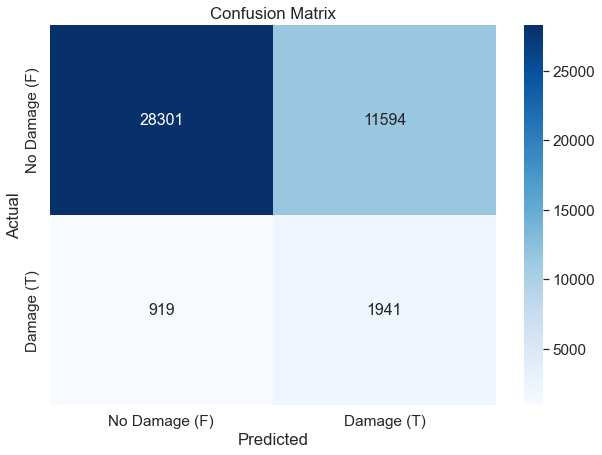

In [149]:
# predictions > 0.6
plot_confusion_matrix(y_test, y_preds >= 0.6, 
                      classes=['No Damage (F)', 'Damage (T)'], 
                      normalize=None)

Changing the threshold to 0.6 pushes the model back the other way, and now we have more unpredicted damage.

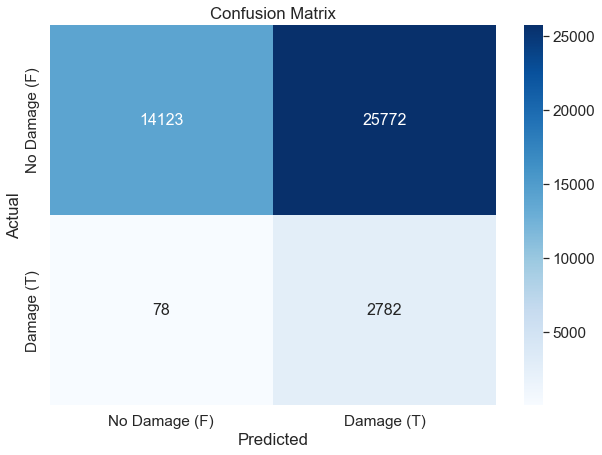

In [150]:
# predictions > 0.4
plot_confusion_matrix(y_test, y_preds >= 0.4, 
                      classes=['No Damage (F)', 'Damage (T)'], 
                      normalize=None)

Going to a lower prediction threshold improves the false negatives and the true positive rate.

In [151]:
print(classification_report(y_test, y_preds.round()))

              precision    recall  f1-score   support

       False       0.99      0.43      0.60     39895
        True       0.10      0.93      0.19      2860

    accuracy                           0.46     42755
   macro avg       0.55      0.68      0.39     42755
weighted avg       0.93      0.46      0.57     42755



In [152]:
print(classification_report(y_test, y_preds >= 0.6))


              precision    recall  f1-score   support

       False       0.97      0.71      0.82     39895
        True       0.14      0.68      0.24      2860

    accuracy                           0.71     42755
   macro avg       0.56      0.69      0.53     42755
weighted avg       0.91      0.71      0.78     42755



In [153]:
print(classification_report(y_test, y_preds >= 0.4))


              precision    recall  f1-score   support

       False       0.99      0.35      0.52     39895
        True       0.10      0.97      0.18      2860

    accuracy                           0.40     42755
   macro avg       0.55      0.66      0.35     42755
weighted avg       0.93      0.40      0.50     42755



## Validation with the 2021 data

(10910, 15) (10910,)
AUC:  0.8446455297739034


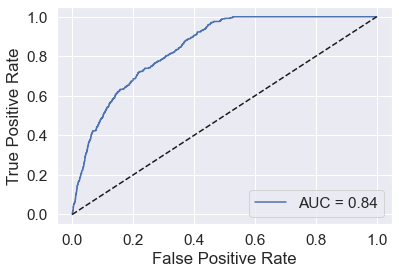

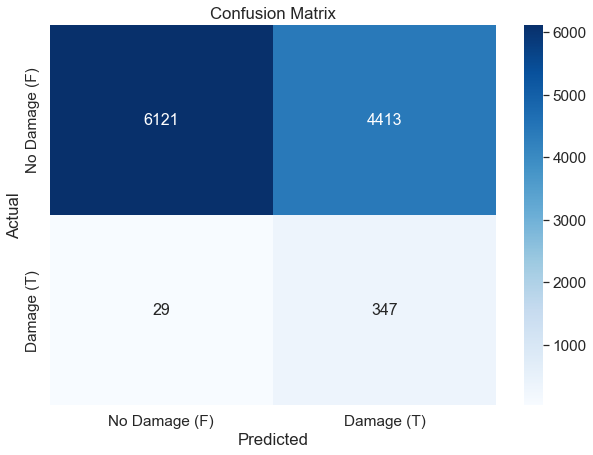

              precision    recall  f1-score   support

       False       1.00      0.58      0.73     10534
        True       0.07      0.92      0.14       376

    accuracy                           0.59     10910
   macro avg       0.53      0.75      0.43     10910
weighted avg       0.96      0.59      0.71     10910



In [155]:
cols = ['AC_MASS',                         
        'PHASE_OF_FLIGHT',    
        'AC_CLASS',
        'PRECIPITATION',
        'SKY',
        'WARNED',
        'INCIDENT_MONTH',
        'LATITUDE',
        'LONGITUDE',
        'INDICATED_DAMAGE'
        ]
# load the validation data
val_df = pd.read_csv('validation_data.csv', usecols=cols)
# drop rows with missing lat long values 
val_df = val_df[~val_df['LATITUDE'].isna()].copy()
# predict geo cluster
val_df['cluster'] = kmeans.predict(val_df[['LATITUDE', 'LONGITUDE']])
 # transfer the c_score to the main dataframe
val_df['c_score'] = val_df.cluster.map(c_score.set_index('cluster')['c_score'].to_dict())
# map the incident month to the month dictionary
val_df['month_score'] = val_df['INCIDENT_MONTH'].map(month_dict)

# convert WARNED to a boolean
val_df['WARNED'] = np.where(val_df['WARNED']=='Yes', 1, 0)
# Fill AC_MASS with the median value
val_df['AC_MASS'] = val_df['AC_MASS'].fillna(val_df['AC_MASS'].median())
# simplify PRECIPITATION 
val_df['PRECIPITATION'].fillna('None', inplace=True)
val_df['PRECIPITATION'] = np.where(val_df['PRECIPITATION']!='None', 1, 0)
# impute SKY
val_df['SKY'].fillna('Unknown', inplace=True)

# get dummies for the categorical variables
val_df = pd.get_dummies(val_df, 
                        columns=['SKY', 'AC_CLASS', 'PHASE_OF_FLIGHT'], 
                        drop_first=True, 
                        dummy_na=True)

# select only the columns that are needed
val_df = val_df[features].dropna()

X_val = val_df.drop(['INDICATED_DAMAGE'], axis=1)
y_val = val_df['INDICATED_DAMAGE'].copy()

# check the shape
print(X_val.shape, y_val.shape)

y_preds = final_model.predict_proba(X_val)[:,1]
fpr, tpr, thresholds = roc_curve(y_val, y_preds)
auc_output = auc(fpr, tpr)
print('AUC: ', auc_output)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc_output).plot()
plt.plot([0, 1], [0, 1], 'k--')
plt.show()
plot_confusion_matrix(y_val, y_preds.round(), 
                      classes=['No Damage (F)', 'Damage (T)'], 
                      normalize=None)

print(classification_report(y_val, y_preds.round()))
